# [Tensorflow - Help Protect the Great Barrier Reef](https://www.kaggle.com/c/tensorflow-great-barrier-reef)
> 水中の画像データからオニヒトデを検出する

## 表示用設定

In [2]:
%%html
<style>
  table {margin-left: 0 !important;}
</style>

## 📒 Notebooks:
copy&edit
* Train: [Great-Barrier-Reef: YOLOv5 [train] 🌊](https://www.kaggle.com/awsaf49/great-barrier-reef-yolov5-train)
* Infer: [Great-Barrier-Reef: YOLOv5 [infer] 🌊](https://www.kaggle.com/awsaf49/great-barrier-reef-yolov5-infer)

# 🛠 必要なライブラリのインストール
* imagesize: 画像のサイズを測定できる
* wandb: 実験管理ができるライブラリ
    * [参考サイト](https://www.nogawanogawa.com/entry/wandb)
    * [公式チュートリアル](https://docs.wandb.ai/)
* libstdc++6: おそらくopencvのために必要なもの

In [2]:
# !pip install -q imagesize
# !pip install -qU wandb
# !add-apt-repository ppa:ubuntu-toolchain-r/test -y
# !apt-get update
# !apt-get upgrade libstdc++6 -y

# 📚 Import Libraries

In [3]:
from itertools import groupby
import numpy as np
from tqdm.notebook import tqdm
tqdm.pandas()
import pandas as pd
import os
import pickle
import cv2
from multiprocessing import Pool
import matplotlib.pyplot as plt
# import cupy as cp
import ast
import glob
from sklearn import model_selection

import torch
from PIL import Image

import shutil

import sys
sys.path.append('..')
# sys.path.append('../input/tensorflow-great-barrier-reef')
os_kind = sys.platform

from joblib import Parallel, delayed
import imagesize

# 📌 キーポイント
* これまでの物体検出コンペと違って**python time-series API**を使って予測が行われる
* BBoxの提出フォーマットはCOCO形式 `[x_min, y_min, width, height]`
* 今回の評価指標は`F2`なので、Recall重視の方が評価指標が上がりやすい。つまり、オニヒトデの誤検出より、見逃し減らすようにした方がスコアが上がりやすい
$$F2 = 5 \cdot \frac{precision \cdot recall}{4\cdot precision + recall}$$

# ⭐ WandB

Weights & Biases (W&B) は、MLOpsの実験をトラッキングするためのプラットフォーム。実験のトラッキング、データセットのバージョニング、モデルの管理ができる。

W&Bの良い機能を一部紹介(copy元の著者由来)

* 実験の追跡、比較、可視化
* ライブメトリクス(live metrics)、ターミナルログ、システム統計情報(system stats)をダッシュボードで見れる
* モデルのバージョンがどのように改善されたかをグラフで示せる

# ⚙実行前設定

## 📖 Meta Data
* `train_images/` - `video_{video_id}/{video_frame}.jpg`という形での学習画像が含まれるフォルダ

* `[train/test].csv` - 画像のメタ情報。テストのメタデータはsubmitしたときにダウンロードされる。submit前は3つの画像に関する情報しかない
* `video_id` - 画像の含まれるvideoのID番号。video_idの順序に特に意味はない。
* `video_frame` - video中に含まれる画像のフレーム番号。同じvideo_idでもダイバーの潜水、浮上があったりするため、急に視点が変わったりする。
* `sequence` - 先ほどのダイバーの潜水、浮上ごとにvideoを細かく分けた時のid。順序に大きな意味はない(著者はこう言ってるが...本当に意味がないのか?)
* `sequence_frame` - sequence中の画像のフレーム番号。
* `image_id` - `{video_id}-{video_frame}`
* `annotations` - オニヒトデのbbox情報。提出する際のフォーマットではないことに注意。`test.csv`では利用できない。このbbox情報の形式はbboxの左下の座標`(x_min, y_min)`と、そこからの`width`と`height`で記載されていて、これはCOCO formatと呼ばれるらしい。


In [4]:
# FOLD = 4 # which fold to train 0 ~ 4
REMOVE_NOBBOX = True # remove images with no bbox
# DATA_DIR  = '/workspace/cots/data'
DATA_DIR  = '../data'
IMAGE_DIR = f'{DATA_DIR}/images' # directory to save images
LABEL_DIR = f'{DATA_DIR}/labels' # directory to save labels
SEED = 42

## Create Directories

In [5]:
# -p : 必要に応じて親ディレクトリも作成
if os_kind == 'win32':
    os.makedirs(IMAGE_DIR, exist_ok=True)
    os.makedirs(LABEL_DIR, exist_ok=True)
else:
    !mkdir -p {IMAGE_DIR}
    !mkdir -p {LABEL_DIR}

# 💼データの準備

## 🔧Helper Functions

In [6]:
def add_fold(df: pd.DataFrame, n_folds: int = 5, seed: int = 42, show_fold_info: bool = False) -> pd.DataFrame:
    """train.csvに交差検証用のFOLDを付与する"""
    # アノテーション数
    df["annotations"] = df["annotations"].apply(ast.literal_eval)
    df["n_annotations"] = df["annotations"].str.len()
    df["has_annotations"] = df["annotations"].str.len() > 0
    df["doesnt_have_annotations"] = df["annotations"].str.len() == 0

    # 物体の有無によるシーケンスの分割
    df["start_cut_here"] = (
        df["has_annotations"] & df["doesnt_have_annotations"].shift(1) & df["doesnt_have_annotations"].shift(2)
    )
    df["end_cut_here"] = df["doesnt_have_annotations"] & df["has_annotations"].shift(1) & df["has_annotations"].shift(2)
    df["sequence_change"] = df["sequence"] != df["sequence"].shift(1)
    df["last_row"] = df.index == len(df) - 1
    df["cut_here"] = df["start_cut_here"] | df["end_cut_here"] | df["sequence_change"] | df["last_row"]
    start_idx = 0
    for subsequence_id, end_idx in enumerate(df[df["cut_here"]].index):
        df.loc[start_idx:end_idx, "subsequence_id"] = subsequence_id
        start_idx = end_idx
    df["subsequence_id"] = df["subsequence_id"].astype(int)
    drop_cols = ["start_cut_here", "end_cut_here", "sequence_change", "last_row", "cut_here", "doesnt_have_annotations"]
    df = df.drop(drop_cols, axis=1)

    # 物体の有無による階層化を用いたsubsequenceのfold振り分け
    df_split = (
        df.groupby("subsequence_id").agg({"has_annotations": "max", "video_frame": "count"}).astype(int).reset_index()
    )
    kf = model_selection.StratifiedKFold(n_splits=n_folds, shuffle=True, random_state=seed)
    for fold_id, (_, val_idx) in enumerate(kf.split(df_split["subsequence_id"], y=df_split["has_annotations"])):
        subseq_val_idx = df_split["subsequence_id"].iloc[val_idx]
        df.loc[df["subsequence_id"].isin(subseq_val_idx), "fold"] = fold_id
        if show_fold_info:
            print(f"fold {fold_id} : {subseq_val_idx.values}")

    df["fold"] = df["fold"].astype(int)

    return df

In [7]:
def get_path(row):
    """
    画像のpathを格納する
    """
    row['old_image_path'] = f'{DATA_DIR}/train_images/video_{row.video_id}/{row.video_frame}.jpg'
    row['image_path'] = f'{IMAGE_DIR}/video_{row.video_id}_{row.video_frame}.jpg'
    row['label_path'] = f'{LABEL_DIR}/video_{row.video_id}_{row.video_frame}.txt'
    return row

## train.csv読み込みと補助カラム付加
付加する補助カラム一覧

| Column Name    | Description                  |
| -------------- | ---------------------------- |
| old_image_path | オリジナル画像パス           |
| image_path     | 加工後の画像パス             |
| label_path     | ラベルパス                   |
| fold           | 検証データになるフォールドID |

In [8]:
# Train Data
df = pd.read_csv(f'{DATA_DIR}/train.csv')
df = df.apply(get_path, axis=1)
df = add_fold(df, n_folds=5, seed=SEED)
display(df.head(2))

,video_id,sequence,video_frame,sequence_frame,image_id,annotations,old_image_path,image_path,label_path,n_annotations,has_annotations,subsequence_id,fold
0,0,40258,0,0,0-0,[],../data/train_images/video_0/0.jpg,../data/images/video_0_0.jpg,../data/labels/video_0_0.txt,0,False,1,0
1,0,40258,1,1,0-1,[],../data/train_images/video_0/1.jpg,../data/images/video_0_1.jpg,../data/labels/video_0_1.txt,0,False,1,0


## Clean Data (オニヒトデが写ってるデータのみに)

- 学習データはオニヒトデが写ってるデータのみに制限する(copy元の著者は簡単に実験できるからこうしているとのこと)
- オニヒトデが写っていないデータを学習にうまいこと使う　or　アノテーション漏れしてるデータを追加するのは有効かも
- trainの大体80%はオニヒトデが写ってない

In [9]:
# # df['num_bbox'] = df['annotations'].progress_apply(lambda x: len(x))
# df['num_bbox'] = df['annotations'].apply(lambda x: len(x))
# data = (df.num_bbox>0).value_counts(normalize=True)*100
# print(f"No BBox: {data[0]:0.2f}% | With BBox: {data[1]:0.2f}%")
# if REMOVE_NOBBOX:
#     df = df.query("num_bbox > 0")

## 🎈Augmentations

# ✏️ Write Images (学習するための画像を抽出)

* kaggle　notebook上で行うときには、kaggle notebookのデフォルトのcurrent directory(`/kaggle/working`)に(`/kaggle/input`)からコピーしないと、書き込み権限が`/kaggle/input`にないため、yolov5を動かした時にエラーになる
* この処理は**Joblib**の**Parallel**で高速化できる

In [10]:
def make_copy(path):
    data = path.split('/')
    filename = data[-1]
    video_id = data[-2]
    new_path = os.path.join(IMAGE_DIR,f'{video_id}_{filename}')
    shutil.copy(path, new_path)
    return

In [11]:
image_paths = df.old_image_path.tolist()
_ = Parallel(n_jobs=-1, backend='threading')(delayed(make_copy)(path) for path in tqdm(image_paths))

  0%|          | 0/23501 [00:00<?, ?it/s]

# 🔨 Model Helper

主に
* bboxのアノテーションの形式(coco->yolo, voc->yolo など)を変える関数
* 画像を描画するための関数
が定義されてる

In [12]:
def voc2yolo(image_height, image_width, bboxes):
    """
    voc  => [x1, y1, x2, y1]
    yolo => [xmid, ymid, w, h] (normalized)
    """

    bboxes = bboxes.copy().astype(float) # otherwise all value will be 0 as voc_pascal dtype is np.int
    
    bboxes[..., [0, 2]] = bboxes[..., [0, 2]]/ image_width
    bboxes[..., [1, 3]] = bboxes[..., [1, 3]]/ image_height
    
    w = bboxes[..., 2] - bboxes[..., 0]
    h = bboxes[..., 3] - bboxes[..., 1]
    
    bboxes[..., 0] = bboxes[..., 0] + w/2
    bboxes[..., 1] = bboxes[..., 1] + h/2
    bboxes[..., 2] = w
    bboxes[..., 3] = h
    
    return bboxes

def yolo2voc(image_height, image_width, bboxes):
    """
    yolo => [xmid, ymid, w, h] (normalized)
    voc  => [x1, y1, x2, y1]
    
    """ 
    bboxes = bboxes.copy().astype(float) # otherwise all value will be 0 as voc_pascal dtype is np.int
    
    bboxes[..., [0, 2]] = bboxes[..., [0, 2]]* image_width
    bboxes[..., [1, 3]] = bboxes[..., [1, 3]]* image_height
    
    bboxes[..., [0, 1]] = bboxes[..., [0, 1]] - bboxes[..., [2, 3]]/2
    bboxes[..., [2, 3]] = bboxes[..., [0, 1]] + bboxes[..., [2, 3]]
    
    return bboxes

def coco2yolo(image_height, image_width, bboxes):
    """
    cocoフォーマットから、yoloフォーマット
    coco => [xmin, ymin, w, h]
    yolo => [xmid, ymid, w, h] (normalized)
    """
    
    bboxes = bboxes.copy().astype(float) # otherwise all value will be 0 as voc_pascal dtype is np.int
    
    # normolizinig
    bboxes[..., [0, 2]]= bboxes[..., [0, 2]]/ image_width
    bboxes[..., [1, 3]]= bboxes[..., [1, 3]]/ image_height
    
    # converstion (xmin, ymin) => (xmid, ymid)
    bboxes[..., [0, 1]] = bboxes[..., [0, 1]] + bboxes[..., [2, 3]]/2
    
    return bboxes

def yolo2coco(image_height, image_width, bboxes):
    """
    yoloフォーマットからcocoフォーマット
    yolo => [xmid, ymid, w, h] (normalized)
    coco => [xmin, ymin, w, h]
    
    """ 
    bboxes = bboxes.copy().astype(float) # otherwise all value will be 0 as voc_pascal dtype is np.int
    
    # denormalizing
    bboxes[..., [0, 2]]= bboxes[..., [0, 2]]* image_width
    bboxes[..., [1, 3]]= bboxes[..., [1, 3]]* image_height
    
    # converstion (xmid, ymid) => (xmin, ymin) 
    bboxes[..., [0, 1]] = bboxes[..., [0, 1]] - bboxes[..., [2, 3]]/2
    
    return bboxes


def voc2coco(bboxes, image_height=720, image_width=1280):
    bboxes  = voc2yolo(image_height, image_width, bboxes)
    bboxes  = yolo2coco(image_height, image_width, bboxes)
    return bboxes


def load_image(image_path):
    return cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)


def plot_one_box(x, img, color=None, label=None, line_thickness=None):
    # Plots one bounding box on image img
    tl = line_thickness or round(0.002 * (img.shape[0] + img.shape[1]) / 2) + 1  # line/font thickness
    color = color or [random.randint(0, 255) for _ in range(3)]
    c1, c2 = (int(x[0]), int(x[1])), (int(x[2]), int(x[3]))
    cv2.rectangle(img, c1, c2, color, thickness=tl, lineType=cv2.LINE_AA)
    if label:
        tf = max(tl - 1, 1)  # font thickness
        t_size = cv2.getTextSize(label, 0, fontScale=tl / 3, thickness=tf)[0]
        c2 = c1[0] + t_size[0], c1[1] - t_size[1] - 3
        cv2.rectangle(img, c1, c2, color, -1, cv2.LINE_AA)  # filled
        cv2.putText(img, label, (c1[0], c1[1] - 2), 0, tl / 3, [225, 255, 255], thickness=tf, lineType=cv2.LINE_AA)

def draw_bboxes(img, bboxes, classes, class_ids, colors = None, show_classes = None, bbox_format = 'yolo', class_name = False, line_thickness = 2):  
     
    image = img.copy()
    show_classes = classes if show_classes is None else show_classes
    colors = (0, 255 ,0) if colors is None else colors
    
    if bbox_format == 'yolo':
        
        for idx in range(len(bboxes)):  
            
            bbox  = bboxes[idx]
            cls   = classes[idx]
            cls_id = class_ids[idx]
            color = colors[cls_id] if type(colors) is list else colors
            
            if cls in show_classes:
            
                x1 = round(float(bbox[0])*image.shape[1])
                y1 = round(float(bbox[1])*image.shape[0])
                w  = round(float(bbox[2])*image.shape[1]/2) #w/2 
                h  = round(float(bbox[3])*image.shape[0]/2)

                voc_bbox = (x1-w, y1-h, x1+w, y1+h)
                plot_one_box(voc_bbox, 
                             image,
                             color = color,
                             label = cls if class_name else str(get_label(cls)),
                             line_thickness = line_thickness)
            
    elif bbox_format == 'coco':
        
        for idx in range(len(bboxes)):  
            
            bbox  = bboxes[idx]
            cls   = classes[idx]
            cls_id = class_ids[idx]
            color = colors[cls_id] if type(colors) is list else colors
            
            if cls in show_classes:            
                x1 = int(round(bbox[0]))
                y1 = int(round(bbox[1]))
                w  = int(round(bbox[2]))
                h  = int(round(bbox[3]))

                voc_bbox = (x1, y1, x1+w, y1+h)
                plot_one_box(voc_bbox, 
                             image,
                             color = color,
                             label = cls if class_name else str(cls_id),
                             line_thickness = line_thickness)

    elif bbox_format == 'voc_pascal':
        
        for idx in range(len(bboxes)):  
            
            bbox  = bboxes[idx]
            cls   = classes[idx]
            cls_id = class_ids[idx]
            color = colors[cls_id] if type(colors) is list else colors
            
            if cls in show_classes: 
                x1 = int(round(bbox[0]))
                y1 = int(round(bbox[1]))
                x2 = int(round(bbox[2]))
                y2 = int(round(bbox[3]))
                voc_bbox = (x1, y1, x2, y2)
                plot_one_box(voc_bbox, 
                             image,
                             color = color,
                             label = cls if class_name else str(cls_id),
                             line_thickness = line_thickness)
    else:
        raise ValueError('wrong bbox format')

    return image

def get_bbox(annots):
    bboxes = [list(annot.values()) for annot in annots]
    return bboxes

def get_imgsize(row):
    """
    画像自体のサイズの獲得
    """
    row['width'], row['height'] = imagesize.get(row['image_path'])
    return row


def show_img(img, bboxes, bbox_format='yolo'):
    names  = ['starfish']*len(bboxes)
    labels = [0]*len(bboxes)
    img    = draw_bboxes(img = img,
                           bboxes = bboxes, 
                           classes = names,
                           class_ids = labels,
                           class_name = True, 
                           colors = colors, 
                           bbox_format = bbox_format,
                           line_thickness = 2)
    return Image.fromarray(img).resize((800, 400))


np.random.seed(32)
colors = [(np.random.randint(255), np.random.randint(255), np.random.randint(255))\
          for idx in range(1)]

## Create BBox (数値だけの形に)

In [13]:
# df['bboxes'] = df.annotations.progress_apply(get_bbox)
df['bboxes'] = df.annotations.apply(get_bbox)
df.head(2)

,video_id,sequence,video_frame,sequence_frame,image_id,annotations,old_image_path,image_path,label_path,n_annotations,has_annotations,subsequence_id,fold,bboxes
0,0,40258,0,0,0-0,[],../data/train_images/video_0/0.jpg,../data/images/video_0_0.jpg,../data/labels/video_0_0.txt,0,False,1,0,[]
1,0,40258,1,1,0-1,[],../data/train_images/video_0/1.jpg,../data/images/video_0_1.jpg,../data/labels/video_0_1.txt,0,False,1,0,[]


## Get Image-Size (画像(jpg)のサイズは均等かどうか)
> 全部の画像のサイズが(横, 縦) = (1280, 720)になってる

In [14]:
# df = df.progress_apply(get_imgsize,axis=1)
df = df.apply(get_imgsize,axis=1)
display(df.width.unique(), df.height.unique())
display(df.head(2))

array([1280], dtype=int64)

array([720], dtype=int64)

,video_id,sequence,video_frame,sequence_frame,image_id,annotations,old_image_path,image_path,label_path,n_annotations,has_annotations,subsequence_id,fold,bboxes,width,height
0,0,40258,0,0,0-0,[],../data/train_images/video_0/0.jpg,../data/images/video_0_0.jpg,../data/labels/video_0_0.txt,0,False,1,0,[],1280,720
1,0,40258,1,1,0-1,[],../data/train_images/video_0/1.jpg,../data/images/video_0_1.jpg,../data/labels/video_0_1.txt,0,False,1,0,[],1280,720


# 🏷️ Create Labels (YOLOのフォーマットのBBox作成)
コンペのbboxフォーマットはCOCOのものなのでYOLOのformatに変える必要がある 

yolov5の入力のために各画像ごとのbboxの情報を記載する`*.txt`が必要。`*.txt`の細かい指定は下記参照。

* オブジェクトごとに1行 (1枚の画像にオニヒトデが2つあるなら２行になる)
* 各行は`class_no, x_center, y_center, width, height`という形式 (bboxはyolo形式ということ)
* bboxは0~1で正規化されていないといけない。つまり、`x_center`と`width`は画像の横(`image_width`)で、`y_center`と`height`は画像の縦(`image_height`)で除算する。
* クラスは0始まり (そもそも今回はオニヒトデだけなので0だけだが)

> コンペのbboxの形式はCOCO形式(`[x_min, y_min, width, height]`)なので、yolo形式(`[x_center, y_center, width, height]`)に変換する必要がある

In [15]:
cnt = 0
all_bboxes = []
for row_idx in tqdm(range(df.shape[0])):
    row = df.iloc[row_idx]
    image_height = row.height
    image_width  = row.width
    bboxes_coco  = np.array(row.bboxes).astype(np.float32).copy()
    num_bbox     = len(bboxes_coco)
    names        = ['cots']*num_bbox
    labels       = [0]*num_bbox
    ## Create Annotation(YOLO)
    with open(row.label_path, 'w') as f:
        if num_bbox<1:
            annot = ''
            f.write(annot)
            cnt+=1
            continue
        bboxes_yolo  = coco2yolo(image_height, image_width, bboxes_coco)
        bboxes_yolo  = np.clip(bboxes_yolo, 0, 1)
        all_bboxes.extend(bboxes_yolo)
        for bbox_idx in range(len(bboxes_yolo)):
            annot = [str(labels[bbox_idx])]+ list(bboxes_yolo[bbox_idx].astype(str))+(['\n'] if num_bbox!=(bbox_idx+1) else [''])
            annot = ' '.join(annot)
            annot = annot.strip(' ')
            f.write(annot)
print('Missing:',cnt)

  0%|          | 0/23501 [00:00<?, ?it/s]

Missing: 18582


# ⭕ BBox Distribution

## `x_center` Vs `y_center`
画像のどこにアノテーションされたオニヒトデがいるのか

-> だいたい真ん中あたりによくいらっしゃる

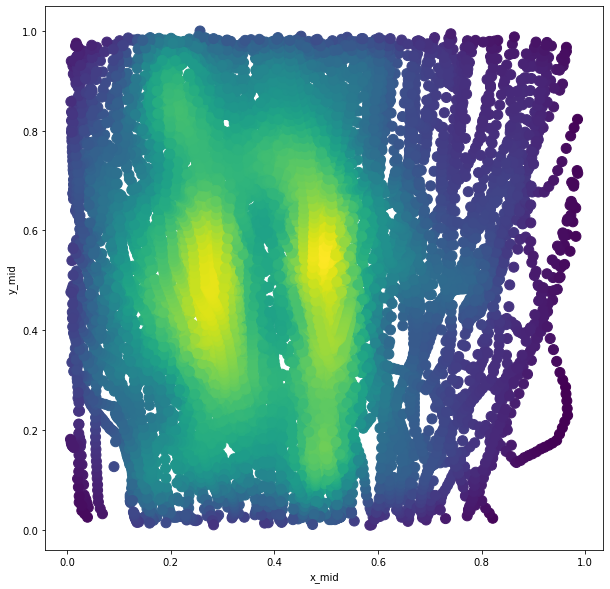

In [16]:
from scipy.stats import gaussian_kde

all_bboxes = np.array(all_bboxes)

x_val = all_bboxes[...,0]
y_val = all_bboxes[...,1]

# Calculate the point density
xy = np.vstack([x_val,y_val])
z = gaussian_kde(xy)(xy)

fig, ax = plt.subplots(figsize = (10, 10))
# ax.axis('off')
ax.scatter(x_val, y_val, c=z, s=100, cmap='viridis')
ax.set_xlabel('x_mid')
ax.set_ylabel('y_mid')
plt.show()

## `width` Vs `height`
bboxのサイズはどれくらいのものが多いのか

-> 大体同じサイズのものが多く、どれも小さい

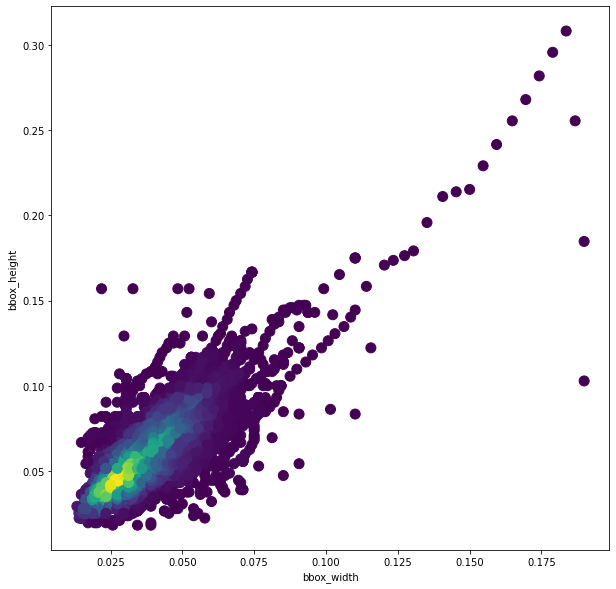

In [17]:
x_val = all_bboxes[...,2]
y_val = all_bboxes[...,3]

# Calculate the point density
xy = np.vstack([x_val,y_val])
z = gaussian_kde(xy)(xy)

fig, ax = plt.subplots(figsize = (10, 10))
# ax.axis('off')
ax.scatter(x_val, y_val, c=z, s=100, cmap='viridis')
ax.set_xlabel('bbox_width')
ax.set_ylabel('bbox_height')
plt.show()

## Area

bboxの面積

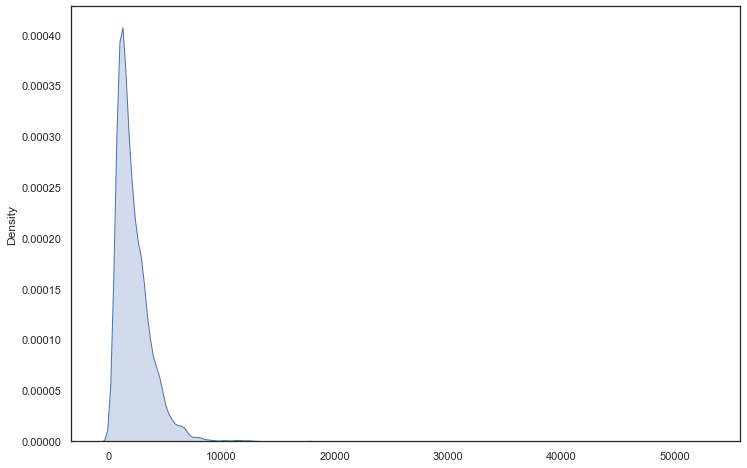

In [18]:
import seaborn as sns
sns.set(style='white')
areas = all_bboxes[...,2]*all_bboxes[...,3]*720*1280
plt.figure(figsize=(12,8))
sns.kdeplot(areas,shade=True,palette='viridis')
# plt.axis('OFF')
plt.show()

# 🌈 Visualization
オニヒトデ博士でない限り、目視で見たところでどこにオニヒトデがいるのかわからなさそう。

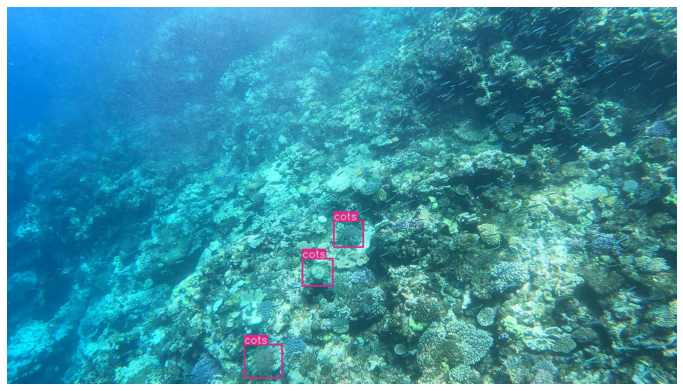

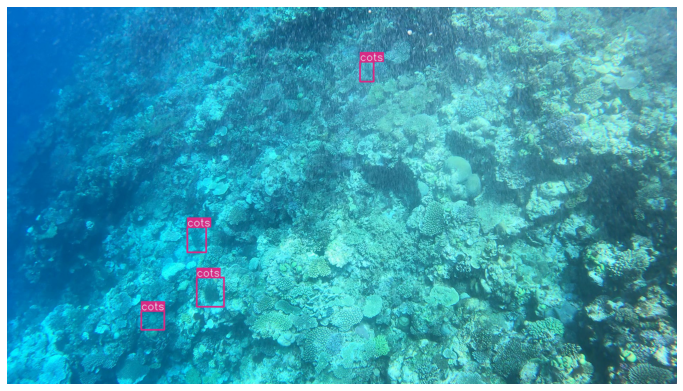

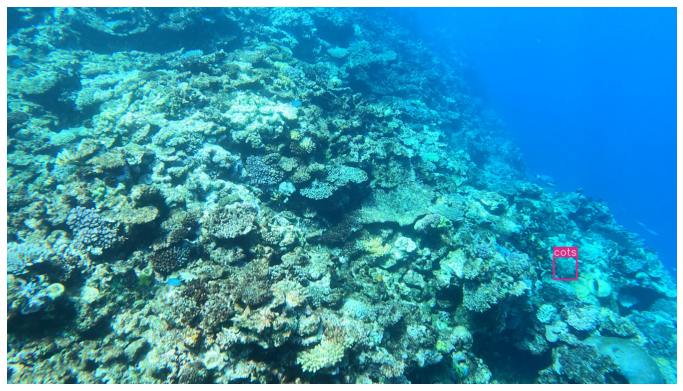

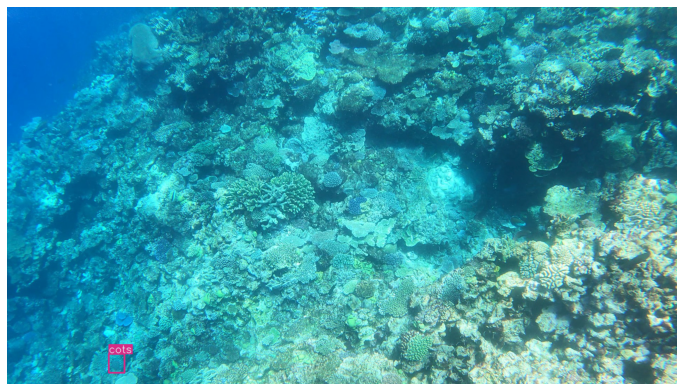

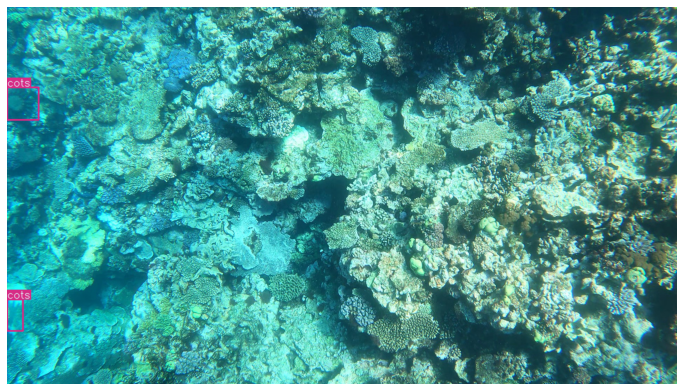

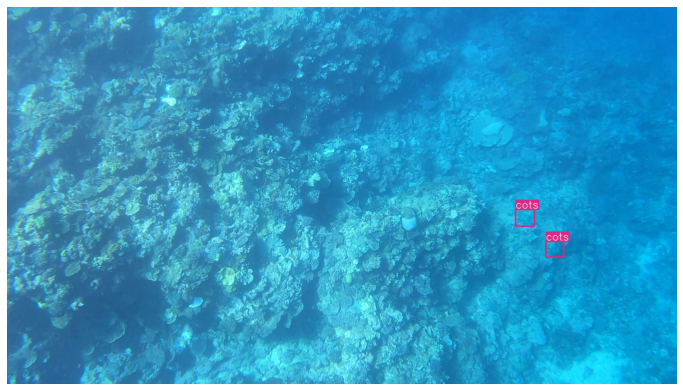

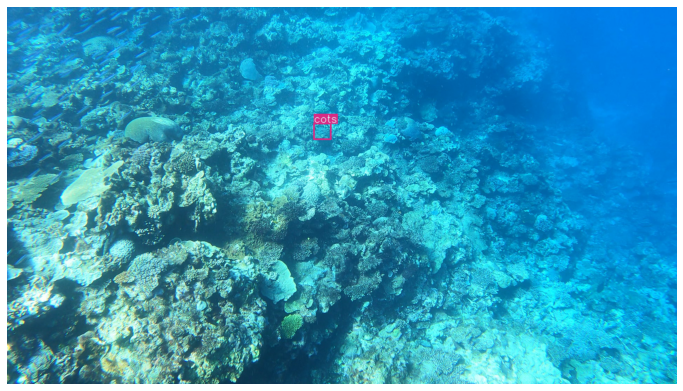

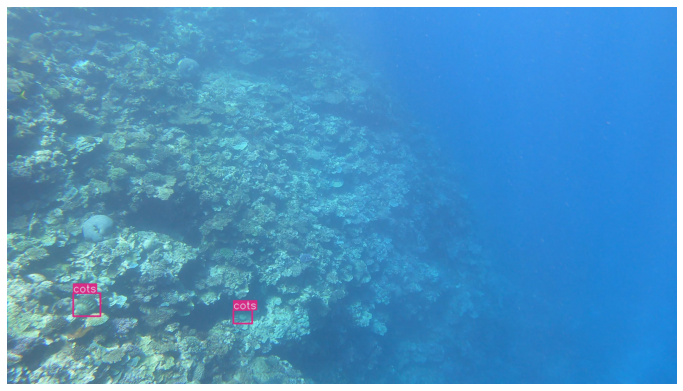

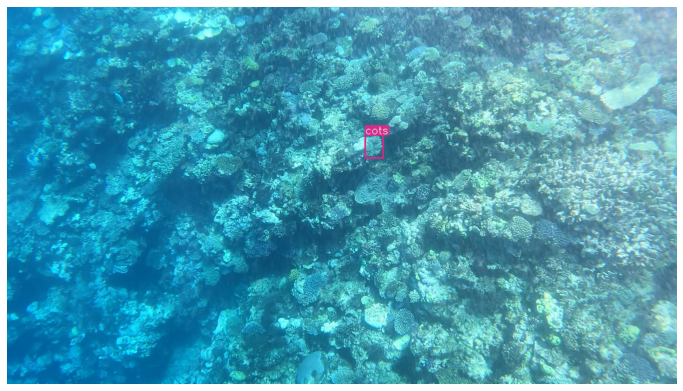

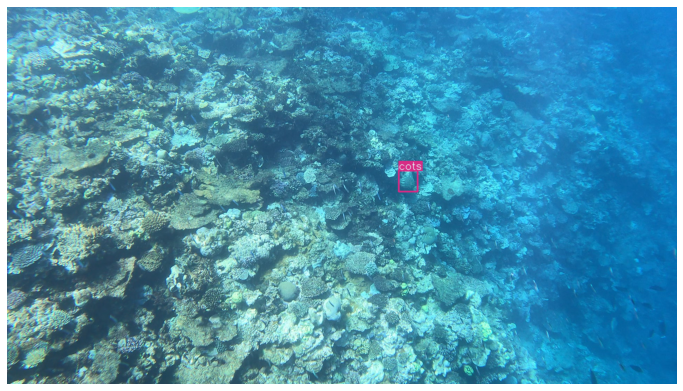

In [19]:
df2 = df[(df.n_annotations>0)].sample(100) # takes samples with bbox
for idx in range(10):
    row = df2.iloc[idx]
    img           = load_image(row.image_path)
    image_height  = row.height
    image_width   = row.width
    bboxes_coco   = np.array(row.bboxes)
    bboxes_yolo   = coco2yolo(image_height, image_width, bboxes_coco)
    names         = ['cots']*len(bboxes_coco)
    labels        = [0]*len(bboxes_coco)

    plt.figure(figsize = (12, 8))
    plt.imshow(draw_bboxes(img = img,
                           bboxes = bboxes_yolo, 
                           classes = names,
                           class_ids = labels,
                           class_name = True, 
                           colors = colors, 
                           bbox_format = 'yolo',
                           line_thickness = 2))
    plt.axis('OFF')
    plt.show()

# 🍚 Dataset

In [20]:
train_files = []
val_files   = []
fold = 0
train_df = df.query(f"fold!={fold}")
valid_df = df.query(f"fold=={fold}")
train_files += list(train_df.image_path.unique())
val_files += list(valid_df.image_path.unique())
len(train_files), len(val_files)

(19509, 3992)

In [21]:
# trainとvalidの割合
print("train: ", round(len(train_files)/ (len(train_files) + len(val_files)) * 100, 1), '%')
print("valid: ", round(len(val_files)/ (len(train_files) + len(val_files)) * 100, 1), '%')

train:  83.0 %
valid:  17.0 %


# ⚙️ Configuration

datasetのconfig fileが必要
1. datasetのroot　dierectory pathと`train / val / test`の画像ファイルのディレクトリ(もしくは、画像のpathが記載された*.txtファイル)を記載する
2. クラスの数を`nc`として記載する
3. クラスのリストを `names` : `['cots']`という形で記載する 

この辺りは実際にyamlの中身を見た方が早い

In [22]:
import yaml

cwd = '../data/'

with open(os.path.join( cwd , 'train.txt'), 'w') as f:
    for path in train_df.image_path.tolist():
        f.write(path+'\n')
        
with open(os.path.join(cwd , 'val.txt'), 'w') as f:
    for path in valid_df.image_path.tolist():
        f.write(path+'\n')

# backgroundのクラスを追加してみる
data = dict(
    path  = '../data/',
    train =  os.path.join( cwd , 'train.txt') ,
    val   =  os.path.join( cwd , 'val.txt' ),
    # nc    = 2,
    nc = 1,
    # names = ['cots', 'bg'],
    names = ['cots']
    )

with open(os.path.join( cwd , 'tgbr.yaml'), 'w') as outfile:
    yaml.dump(data, outfile, default_flow_style=False)

f = open(os.path.join( cwd , 'tgbr.yaml'), 'r')
print('\nyaml:')
print(f.read())


yaml:
names:
- cots
nc: 1
path: ../data/
train: ../data/train.txt
val: ../data/val.txt



# 📦 [YOLOv5](https://github.com/ultralytics/yolov5/)

この辺りのディレクトリの配置はよしなに設定する

In [23]:
# %cd data/
# !rm -r data/yolov5
# !git clone https://github.com/ultralytics/yolov5 # clone
# !cp -r /kaggle/input/yolov5-lib-ds /kaggle/working/yolov5
%cd ../yolov5
# %pip install -qr requirements.txt  # install

C:\Users\s3616\Desktop\tensorflow-great-barrier-reef\chieda\yolov5


In [24]:
from yolov5 import utils

In [25]:
display = utils.notebook_init()  # checks

YOLOv5  v6.0-155-gdc54ed5 torch 1.9.1 CUDA:0 (NVIDIA GeForce RTX 2070 SUPER, 8192MiB)


Setup complete  (16 CPUs, 63.9 GB RAM, 279.8/464.7 GB disk)


In [26]:
# Weights & Biases  (optional)
import wandb
wandb.login(anonymous='must')

wandb: Currently logged in as: anony-mouse-175257 (use `wandb login --relogin` to force relogin)


True

# 🚅 Training

In [27]:
# Train YOLOv5s on COCO128 for 3 epochs ← 事前学習の情報?
# --batch 16\ --epochs 30\
# --cache\
# --evolve\ ← ハイパラチューニングしてくれる
# --hyp /workspace/cots/yolov5/data/hyps/hyp.finetune.yaml\ ← ハイパラの設定
# --hyp /workspace/cots/yolov5/data/hyps/hyp.scratch-high.yaml\

# !python train.py --img 1280 --device 0 --batch 8 --epochs 20 --data ../data/tgbr.yaml --hyp ../yolov5/data/hyps/hyp.finetune.yaml --weights yolov5s.pt

# ✨ Overview result

## Output Files

In [28]:
exp_no =4

In [29]:
!ls ../yolov5/runs/train/exp{exp_no}


(fastai) C:\Users\s3616\Desktop\tensorflow-great-barrier-reef\chieda\yolov5>dir
 ドライブ C のボリューム ラベルは Windows です
 ボリューム シリアル番号は B049-144A です

 C:\Users\s3616\Desktop\tensorflow-great-barrier-reef\chieda\yolov5 のディレクトリ

2021/12/24  00:34    <DIR>          .
2021/12/24  00:34    <DIR>          ..
2021/12/22  02:39             3,905 .dockerignore
2021/12/22  02:39                77 .gitattributes
2021/12/22  02:39    <DIR>          .github
2021/12/22  02:39             4,219 .gitignore
2021/12/22  02:39             1,619 .pre-commit-config.yaml
2021/12/22  02:39             5,085 CONTRIBUTING.md
2021/12/22  02:39    <DIR>          data
2021/12/22  02:39            12,603 detect.py
2021/12/22  02:39             2,227 Dockerfile
2021/12/22  02:39            21,073 export.py
2021/12/22  02:39             6,524 hubconf.py
2021/12/22  02:39            35,801 LICENSE
2021/12/22  02:48    <DIR>          models
2021/12/22  02:39            15,038 README.md
2021/12/22  02:39               928 requi

# 🔭 Batch Image

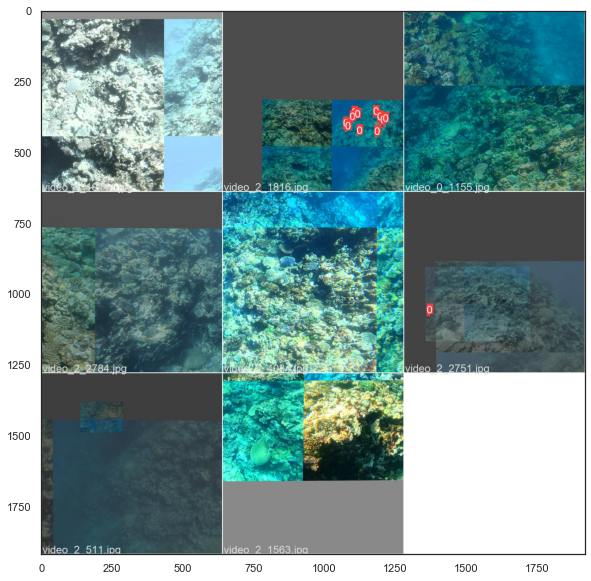

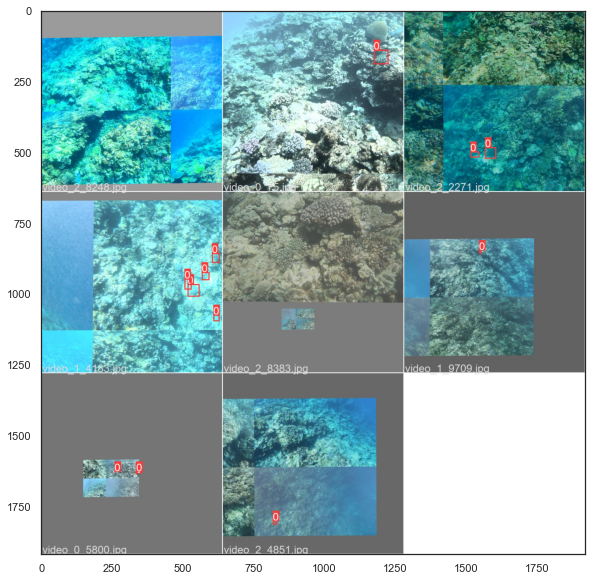

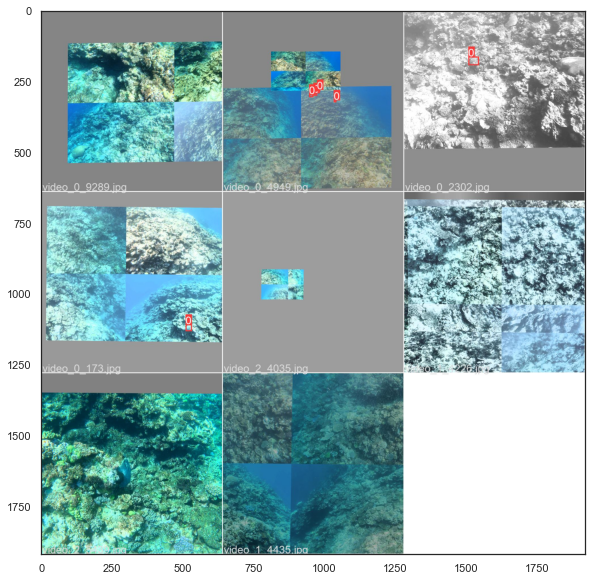

In [30]:
import matplotlib.pyplot as plt
plt.figure(figsize = (10, 10))
plt.imshow(plt.imread(f'../yolov5/runs/train/exp{exp_no}/train_batch0.jpg'))

plt.figure(figsize = (10, 10))
plt.imshow(plt.imread(f'../yolov5/runs/train/exp{exp_no}/train_batch1.jpg'))

plt.figure(figsize = (10, 10))
plt.imshow(plt.imread(f'../yolov5/runs/train/exp{exp_no}/train_batch2.jpg'))

## GT Vs Pred

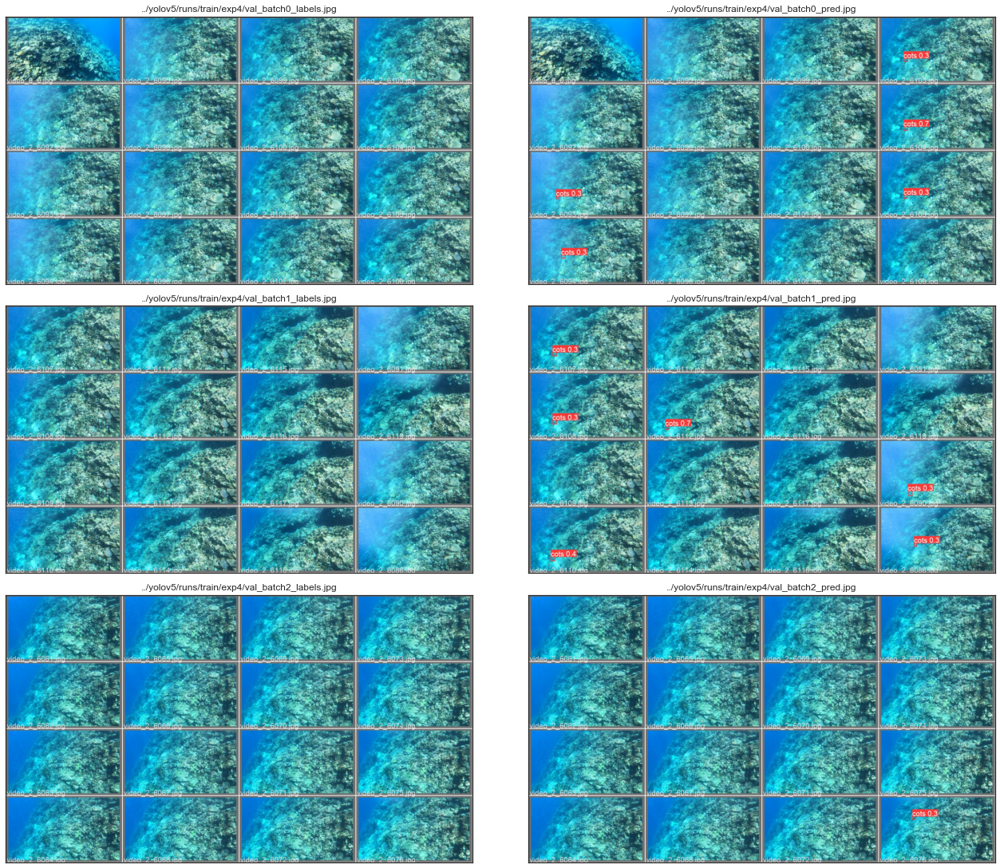

In [31]:
fig, ax = plt.subplots(3, 2, figsize = (2*9,3*5), constrained_layout = True)
for row in range(3):
    ax[row][0].imshow(plt.imread(f'../yolov5/runs/train/exp{exp_no}/val_batch{row}_labels.jpg'))
    ax[row][0].set_xticks([])
    ax[row][0].set_yticks([])
    ax[row][0].set_title(f'../yolov5/runs/train/exp{exp_no}/val_batch{row}_labels.jpg', fontsize = 12)
    
    ax[row][1].imshow(plt.imread(f'../yolov5/runs/train/exp{exp_no}/val_batch{row}_pred.jpg'))
    ax[row][1].set_xticks([])
    ax[row][1].set_yticks([])
    ax[row][1].set_title(f'../yolov5/runs/train/exp{exp_no}/val_batch{row}_pred.jpg', fontsize = 12)
plt.show()

# 🔍 Result

## Score Vs Epoch

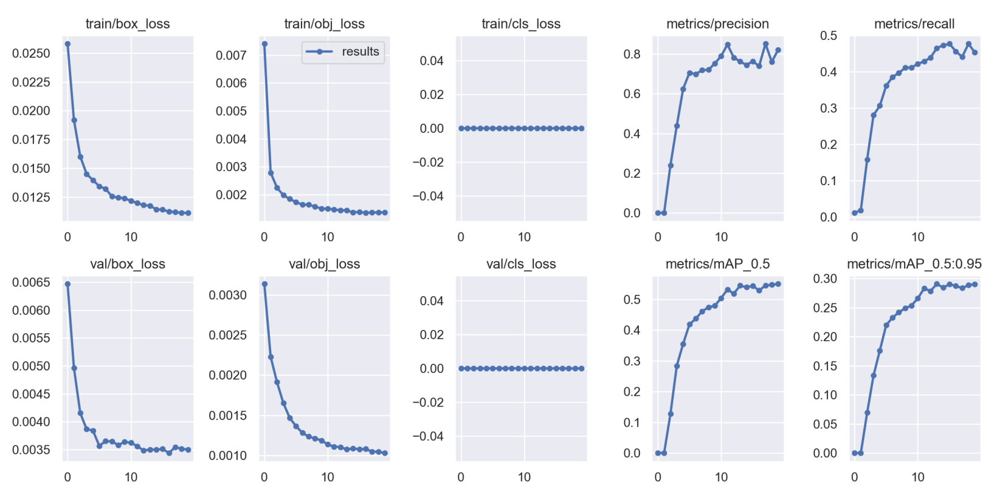

In [32]:
plt.figure(figsize=(30,15))
plt.axis('off')
plt.imshow(plt.imread(f'../yolov5/runs/train/exp{exp_no}/results.png'));

## Confusion Matrix

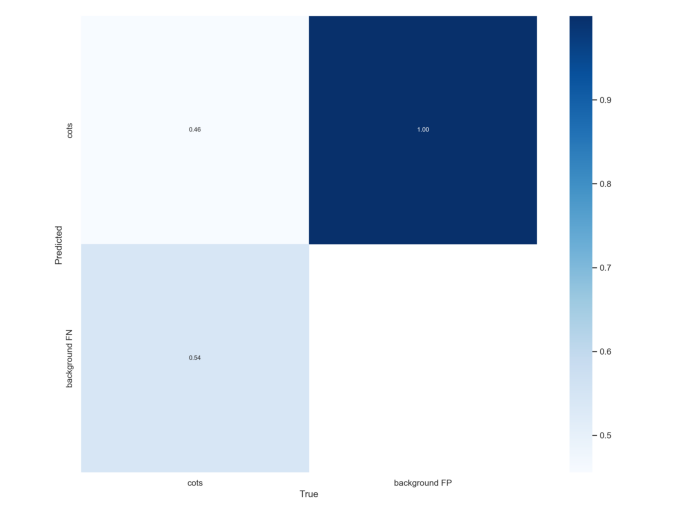

In [33]:
plt.figure(figsize=(12,10))
plt.axis('off')
plt.imshow(plt.imread(f'../yolov5/runs/train/exp{exp_no}/confusion_matrix.png'));

## Metrics

Metric: F1


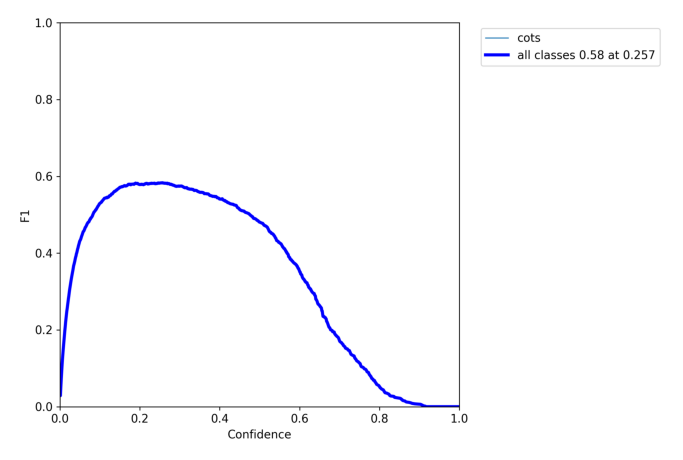

Metric: PR


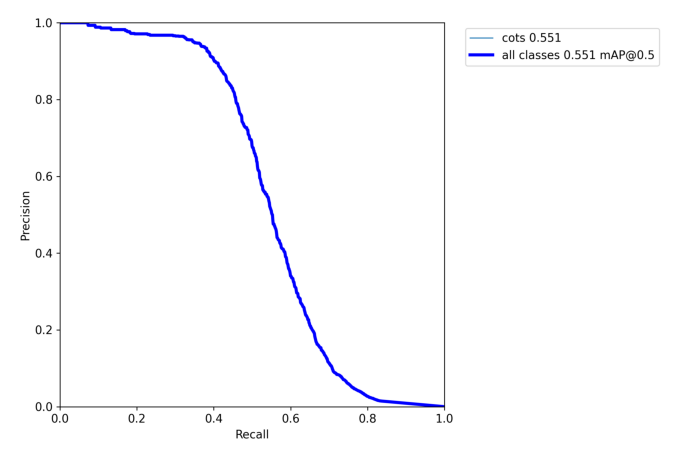

Metric: P


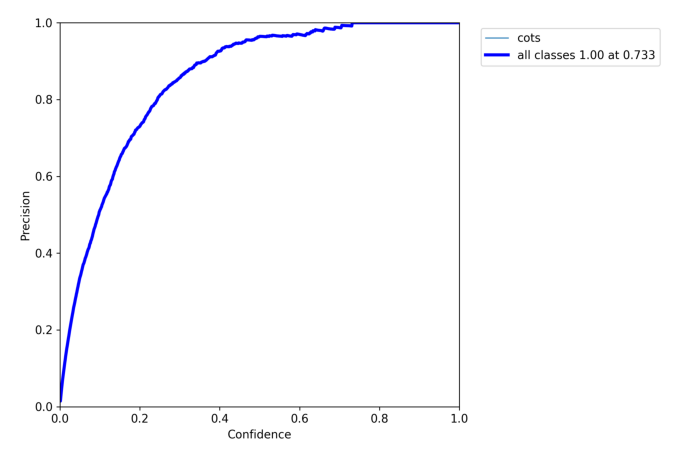

Metric: R


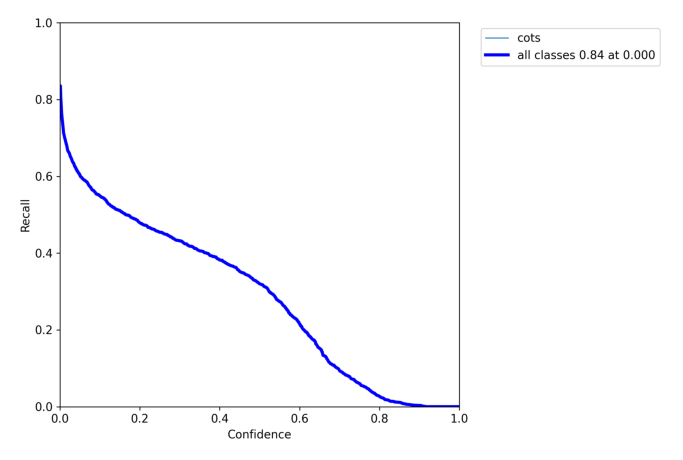

In [34]:
for metric in ['F1', 'PR', 'P', 'R']:
    print(f'Metric: {metric}')
    plt.figure(figsize=(12,10))
    plt.axis('off')
    plt.imshow(plt.imread(f'../yolov5/runs/train/exp{exp_no}/{metric}_curve.png'));
    plt.show()

# Calculation Val CV

In [35]:
!pip install ensemble-boxes

In [36]:
from ensemble_boxes import *

In [37]:
CKPT_PATH = f'../yolov5/runs/train/exp{exp_no}/weights/best.pt'
IMG_SIZE  = 1280
# IMG_SIZE  = 960
# CONF      = 0.15
# IOU       = 0.50
# CONF      = 0.3
# IOU       = 0.4
AUGMENT   = False
DEVICE = 3

## helper

In [61]:
def load_model(ckpt_path, conf=0.25, iou=0.50, device=0):
    model = torch.hub.load('../yolov5',
                           'custom',
                           path=ckpt_path,
                           source='local',
                           force_reload=True,
                           device=device)  # local repo
    model.conf = conf  # NMS confidence threshold
    model.iou  = iou  # NMS IoU threshold
    model.classes = None   # (optional list) filter by class, i.e. = [0, 15, 16] for persons, cats and dogs
    model.multi_label = False  # NMS multiple labels per box
    model.max_det = 1000  # maximum number of detections per image
    return model


def predict(model, img, size=768, augment=False):
    height, width = img.shape[:2]
    results = model(img, size=size, augment=augment)  # custom inference size
    preds   = results.pandas().xyxy[0]
    bboxes  = preds[['xmin','ymin','xmax','ymax']].values
    if len(bboxes):
        # bboxes  = voc2coco(bboxes, height, width).astype(int)
        confs   = preds.confidence.values
        return bboxes, confs
    else:
        return [],[]
    

def predict_wbf_format(model, img, size=1280, augment=False):
    """
    wbfに必要なobject毎の
    * bbox(0 ~ 1に正規化)
    * confidence score
    * label (今回はオニヒトデだけなのであまり関係ないが、wbfに必要)
    """
    height, width = img.shape[:2]
    results = model(img, size=size, augment=augment)  # custom inference size
    preds   = results.pandas().xyxy[0]
    # normalizing
    preds[['xmin', 'xmax']] = preds[['xmin', 'xmax']] / width
    preds[['ymin', 'ymax']] = preds[['ymin', 'ymax']] / height
    
    bboxes  = preds[['xmin','ymin','xmax','ymax']].values
    
    if len(bboxes):
        confs   = preds.confidence.values
        labels = preds['class'].values
        return bboxes, confs, labels
    else:
        return [], [], []

In [62]:
from typing import List

from torchvision.ops import box_iou


def calculate_score(
    preds: List[torch.Tensor],
    gts: List[torch.Tensor],
    iou_th: float
) -> float:
    num_tp = 0
    num_fp = 0
    num_fn = 0
    for p, gt in zip(preds, gts):
        if len(p) and len(gt):
            iou_matrix = box_iou(p, gt)
            tp = len(torch.where(iou_matrix.max(0)[0] >= iou_th)[0])
            fp = len(p) - tp
            fn = len(torch.where(iou_matrix.max(0)[0] < iou_th)[0])
            num_tp += tp
            num_fp += fp
            num_fn += fn
        elif len(p) == 0 and len(gt):
            num_fn += len(gt)
        elif len(p) and len(gt) == 0:
            num_fp += len(p)
    if (5 * num_tp + 4 * num_fn + num_fp )!=0:
        score = 5 * num_tp / (5 * num_tp + 4 * num_fn + num_fp )
    else:
        score = np.nan
    if (num_tp+num_fn) != 0:
        recall = num_tp/ (num_tp+num_fn)
    else:
        recall=np.nan
    if (num_tp+num_fp)!=0:
        precission = num_tp/ (num_tp+num_fp)
    else:
        precission=np.nan
    return score, precission, recall

def evaluate_f2(confthre):
    scores = []
    prec05 = []
    rec05 = []
    prec03 = []
    rec03 = []
    iou_ths = np.arange(0.3, 0.85, 0.05)
    with torch.no_grad():
        for images, targets in dl_val:
            model.eval()
            images = list(image.to(device) for image in images)
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

            preds = model(images)

            for i in range(len(images)):
                preds[i]['boxes']=preds[i]['boxes'].int()
                preds[i]['boxes']=preds[i]['boxes'][preds[i]['scores']>confthre]
                score = [calculate_score(preds[i]['boxes'].unsqueeze(0), targets[i]['boxes'].unsqueeze(0), iou_th)[0] for iou_th in iou_ths]
                scores.append(np.nanmean(score))
                prec05.append(calculate_score(preds[i]['boxes'].unsqueeze(0), targets[i]['boxes'].unsqueeze(0), 0.5)[1]) 
                prec03.append(calculate_score(preds[i]['boxes'].unsqueeze(0), targets[i]['boxes'].unsqueeze(0), 0.3)[1]) 
                rec05.append(calculate_score(preds[i]['boxes'].unsqueeze(0), targets[i]['boxes'].unsqueeze(0), 0.5)[2]) 
                rec03.append(calculate_score(preds[i]['boxes'].unsqueeze(0), targets[i]['boxes'].unsqueeze(0), 0.3)[2]) 
    print(f'F2 Score for confthre , {confthre}, :  {np.nanmean(scores):.3f} Precission .5: {np.nanmean(prec05):.3f} Precission .3: {np.nanmean(prec03):.3f}  Recall .5: {np.nanmean(rec05):.3f} Recall .3: {np.nanmean(rec03):.3f}')

In [63]:
# valid_df_ = valid_df[valid_df['bboxes'].apply(len) > 0]
gt = valid_df.bboxes.apply(lambda x: torch.sort( torch.tensor( yolo2voc(720, 1280, coco2yolo(720, 1280, np.array(x).astype(np.float32)))), dim=0).values if len(x)
                           else torch.tensor(np.array([]).astype(np.float32))).values.tolist()

In [64]:
print("------------loading model------------")
model = load_model(CKPT_PATH, conf=0.0, iou=1.0, device=3)
image_paths = valid_df.image_path.tolist()
print("------------predict & post processing------------")
for CONF in [0.1, 0.2, 0.3]:
    for IOU in [0.1, 0.2, 0.3]:
        preds_bboxes = []
        for idx, path in tqdm(enumerate(image_paths), total=len(image_paths)):
            boxes_list = []
            confis_list = []
            labels_list = []    
            img = cv2.imread(path)[...,::-1]
            height, width = img.shape[:2]
            bboxes1, confis1, labels1 = predict_wbf_format(model, img, size=IMG_SIZE, augment=AUGMENT)

            boxes_list.append(bboxes1)
            confis_list.append(confis1)
            labels_list.append(labels1)
            # bboxes, confis, labels = nms(boxes_list, confis_list, labels_list, weights=None, iou_thr=0.4)
            # bboxes, confis, labels = soft_nms(boxes_list, confis_list, labels_list, weights=None, iou_thr=IOU, thresh=CONF)
            bboxes, confis, labels = non_maximum_weighted(boxes_list, confis_list, labels_list, weights=None, iou_thr=IOU, skip_box_thr=CONF)
            # bboxes, confis, labels = weighted_boxes_fusion(boxes_list, confis_list, labels_list, weights=None, iou_thr=IOU, skip_box_thr=CONF)
            if len(bboxes):
                bboxes = bboxes * (width, height, width, height)
                preds_bboxes.append(torch.sort(torch.from_numpy(bboxes.astype(np.float32)), dim=0).values)
                bboxes = voc2coco(bboxes, height, width)
            else:
                preds_bboxes.append(bboxes)
            # if idx<3:
            #     display(show_img(img, bboxes, bbox_format='coco'))

        print("------------calculating score------------")
        iou_ths = np.arange(0.3, 0.85, 0.05)
        scores = [calculate_score(preds_bboxes, gt, iou_th) for iou_th in iou_ths]
        print("conf: ", CONF)
        print("iou: ", IOU)
        print("val score: ", np.mean(scores))

YOLOv5  v6.0-155-gdc54ed5 torch 1.9.1 CUDA:3 (NVIDIA GeForce RTX 2070 SUPER, 8192MiB)

Fusing layers... 


------------loading model------------


Model Summary: 280 layers, 12308200 parameters, 0 gradients, 16.2 GFLOPs
Adding AutoShape... 


------------predict & post processing------------


  0%|          | 0/3992 [00:00<?, ?it/s]

------------calculating score------------
conf:  0.1
iou:  0.1
val score:  0.3117892667798364


  0%|          | 0/3992 [00:00<?, ?it/s]

------------calculating score------------
conf:  0.1
iou:  0.2
val score:  0.3121782520665729


  0%|          | 0/3992 [00:00<?, ?it/s]

------------calculating score------------
conf:  0.1
iou:  0.3
val score:  0.31210797783683064


  0%|          | 0/3992 [00:00<?, ?it/s]

------------calculating score------------
conf:  0.2
iou:  0.1
val score:  0.3810738371803913


  0%|          | 0/3992 [00:00<?, ?it/s]

------------calculating score------------
conf:  0.2
iou:  0.2
val score:  0.3798289190326993


  0%|          | 0/3992 [00:00<?, ?it/s]

------------calculating score------------
conf:  0.2
iou:  0.3
val score:  0.3798289190326993


  0%|          | 0/3992 [00:00<?, ?it/s]

------------calculating score------------
conf:  0.3
iou:  0.1
val score:  0.40621856636930176


  0%|          | 0/3992 [00:00<?, ?it/s]

------------calculating score------------
conf:  0.3
iou:  0.2
val score:  0.40621856636930176


  0%|          | 0/3992 [00:00<?, ?it/s]

------------calculating score------------
conf:  0.3
iou:  0.3
val score:  0.40621856636930176


In [65]:
scores

[(0.36988923834267745, 0.658952496954933, 0.3333333333333333),
 (0.3671543826063175, 0.6540803897685749, 0.33086876155268025),
 (0.36373581293586765, 0.6479902557856273, 0.32778804682686385),
 (0.3610009571995077, 0.6431181485992692, 0.32532347504621073),
 (0.35963352933132775, 0.6406820950060901, 0.32409118915588414),
 (0.35758238752905785, 0.6370280146163215, 0.32224276032039434),
 (0.352112676056338, 0.6272838002436053, 0.3173136167590881),
 (0.33912211130862846, 0.6041412911084044, 0.30560690080098585),
 (0.3131409818132094, 0.5578562728380024, 0.28219346888478125),
 (0.26664843429509094, 0.47503045066991473, 0.24029574861367836),
 (0.19007247367701355, 0.3386114494518879, 0.17128773875539124)]